# Importer Libraries et Données

In [1]:
# import libraries
import pickle

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
# import plotly.express as px
import plotly.graph_objects as go
import plotly.offline as pyo
import umap.umap_ as umap
from scipy.cluster.hierarchy import dendrogram
import seaborn as sns
from sklearn.cluster import AgglomerativeClustering, DBSCAN, KMeans
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.metrics import davies_bouldin_score
from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer

# sns.set_style('whitegrid')

2021-11-16 13:41:03.447634: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.11.0


In [2]:
# import data
df = pd.read_csv('../data/df_model_final.csv')
df.shape

(100736, 29)

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100736 entries, 0 to 100735
Data columns (total 29 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   order_purchase_timestamp    100736 non-null  object 
 1   product_name_length         100736 non-null  float64
 2   product_description_length  100736 non-null  float64
 3   product_photos_qty          100736 non-null  float64
 4   payment_installments        100736 non-null  float64
 5   number_of_reviews           100736 non-null  float64
 6   review_score                100736 non-null  float64
 7   price_log                   100736 non-null  float64
 8   distance                    100736 non-null  float64
 9   freight_price_ratio         100736 non-null  float64
 10  delivery_time_days          100736 non-null  int64  
 11  Respect_delivery_bool       100736 non-null  int64  
 12  Respect_shipping_bool       100736 non-null  int64  
 13  volumn_cm3    

In [4]:
df.drop(columns=['order_purchase_timestamp'], inplace=True)
df.shape

(100736, 28)

In [5]:
def plot_dendrogram(
    model: AgglomerativeClustering, title: str, xlabel: str, y: int, **kwargs
):
    # Create linkage matrix and then plot the dendrogram

    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack(
        [model.children_, model.distances_, counts]
    ).astype(float)

    plt.title(title)
    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs)
    plt.axhline(y=y, color="r", linestyle="--")
    plt.xlabel(xlabel)
    plt.show()


def plot_clusters(x: str, y: str, data: pd.DataFrame, hue: str, title: str = None):
    sns.lmplot(
        x=x,
        y=y,
        data=data,
        legend=True,
        height=9,
        hue=hue,
        scatter_kws={"s": 10, "alpha": 0.3},
        fit_reg=False,
    )

    if title is not None:
        plt.title(title, fontdict={"fontsize": 15})
    plt.show()


def plot_radar(cluster: list, title: str = None):
    labels = df.columns.to_list()
    labels = [*labels[:-1], labels[0]]
    fig = go.Figure(
        data=[go.Scatterpolar(r=cluster, theta=labels, fill="toself",)],
        layout=go.Layout(
            title=go.layout.Title(text=title), polar={"radialaxis": {"visible": True}},
        ),
    )
    fig.update_layout(template=None)
    pyo.iplot(fig)

# Standard Scaler

In [6]:
scaler = StandardScaler()
df_ss = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)
df_ss.describe()

,product_name_length,product_description_length,product_photos_qty,payment_installments,number_of_reviews,review_score,price_log,distance,freight_price_ratio,delivery_time_days,...,same_city,same_state,weekend,holiday,order_status,product_category_label,payment_type_boleto,payment_type_credit_card,payment_type_debit_card,payment_type_voucher
count,1.007360e+05,1.007360e+05,1.007360e+05,1.007360e+05,1.007360e+05,1.007360e+05,1.007360e+05,1.007360e+05,1.007360e+05,1.007360e+05,...,1.007360e+05,1.007360e+05,1.007360e+05,1.007360e+05,1.007360e+05,1.007360e+05,1.007360e+05,1.007360e+05,1.007360e+05,1.007360e+05
mean,1.131461e-16,-1.027843e-16,-2.311236e-15,-1.493295e-16,-7.866674e-16,2.608187e-15,-2.534416e-17,-1.636999e-16,8.995765e-17,4.314656e-17,...,3.773949e-16,4.023258e-16,-1.200100e-15,3.638808e-15,5.414334e-15,1.835258e-16,1.905894e-15,2.902144e-15,4.649976e-16,-5.375609e-16
std,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,...,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00
min,-4.199601e+00,-1.190623e+00,-1.265218e+00,-1.062300e+00,-8.957256e+00,-3.116391e+00,-4.895655e+00,-8.573698e-01,-4.061017e+01,-1.266949e+00,...,-2.319267e-01,-7.486117e-01,-5.455664e-01,-1.537907e+00,-1.295698e+02,-9.462578e-01,-4.850586e-01,-1.688290e+00,-1.223195e-01,-2.401069e-01
25%,-5.391647e-01,-6.706812e-01,-6.945499e-01,-6.897814e-01,9.524355e-03,-9.576756e-02,-6.864287e-01,-7.766561e-01,-5.193039e-01,-6.390431e-01,...,-2.319267e-01,-7.486117e-01,-5.455664e-01,-1.537907e+00,7.717848e-03,-7.178098e-01,-4.850586e-01,-1.688290e+00,-1.223195e-01,-2.401069e-01
50%,3.323678e-01,-2.772940e-01,-6.945499e-01,-6.897814e-01,9.524355e-03,6.593882e-01,1.565952e-02,-2.736430e-01,-2.257265e-01,-2.204395e-01,...,-2.319267e-01,-7.486117e-01,-5.455664e-01,6.502344e-01,7.717848e-03,-2.609137e-01,-4.850586e-01,5.923153e-01,-1.223195e-01,-2.401069e-01
75%,7.681340e-01,3.127868e-01,4.467861e-01,4.277732e-01,9.524355e-03,6.593882e-01,6.339677e-01,3.373412e-01,1.741228e-01,3.028151e-01,...,-2.319267e-01,1.335806e+00,-5.455664e-01,6.502344e-01,7.717848e-03,6.528784e-01,-4.850586e-01,5.923153e-01,-1.223195e-01,-2.401069e-01
max,2.424046e+00,4.896205e+00,1.014814e+01,7.878137e+00,1.794308e+01,6.593882e-01,4.833405e+00,1.279914e+01,1.910171e+01,2.060509e+01,...,4.311707e+00,1.335806e+00,1.832958e+00,6.502344e-01,7.717848e-03,3.394255e+00,2.061607e+00,5.923153e-01,8.175310e+00,4.164812e+00


## Clustering
### Clustering Hiérarchique

In [7]:
df_ss.sample(5)

,product_name_length,product_description_length,product_photos_qty,payment_installments,number_of_reviews,review_score,price_log,distance,freight_price_ratio,delivery_time_days,...,same_city,same_state,weekend,holiday,order_status,product_category_label,payment_type_boleto,payment_type_credit_card,payment_type_debit_card,payment_type_voucher
74862,0.158061,-0.737771,-0.694550,-0.689781,0.009524,-0.095768,-1.948253,-0.125680,0.888044,-0.743694,...,-0.231927,-0.748612,1.832958,-1.537907,0.007718,-0.032466,-0.485059,0.592315,-0.12232,-0.240107
86586,-0.277705,-0.922266,-0.123882,-0.689781,0.009524,0.659388,-1.649803,0.658491,1.555676,0.198164,...,-0.231927,-0.748612,-0.545566,0.650234,0.007718,-0.946258,2.061607,-1.688290,-0.12232,-0.240107
11363,0.942441,1.454829,1.588122,-0.317263,0.009524,-0.095768,0.596257,3.162806,3.236832,0.616768,...,-0.231927,-0.748612,-0.545566,-1.537907,0.007718,-0.260914,-0.485059,0.592315,-0.12232,-0.240107
93672,0.768134,-0.484661,-0.694550,-0.689781,0.009524,0.659388,-0.127874,-0.828388,-0.530992,-0.639043,...,-0.231927,1.335806,-0.545566,-1.537907,0.007718,1.338223,-0.485059,0.592315,-0.12232,-0.240107
30454,0.942441,1.695741,-0.694550,2.662882,0.009524,0.659388,0.703269,-0.312958,1.214608,-0.325090,...,-0.231927,-0.748612,-0.545566,0.650234,0.007718,-0.717810,-0.485059,0.592315,-0.12232,-0.240107


In [32]:
%%time
# setting distance_threshold=0 ensures we compute the full tree.
ac40k = AgglomerativeClustering(distance_threshold=0, n_clusters=None)
ac40k = ac40k.fit(df_ss[:40000])

CPU times: user 1min 9s, sys: 2.25 s, total: 1min 11s
Wall time: 1min 11s


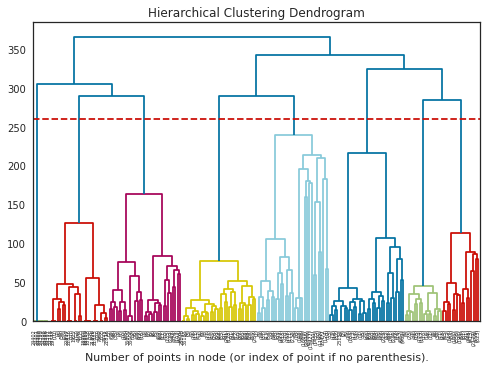

CPU times: user 3.8 s, sys: 396 ms, total: 4.2 s
Wall time: 3.66 s


In [36]:
%%time
title = "Hierarchical Clustering Dendrogram"
xlabel = "Number of points in node (or index of point if no parenthesis)."
# plot the top seven levels of the dendrogram
plot_dendrogram(ac40k, title=title, xlabel=xlabel, y=260, truncate_mode="level", p=7)

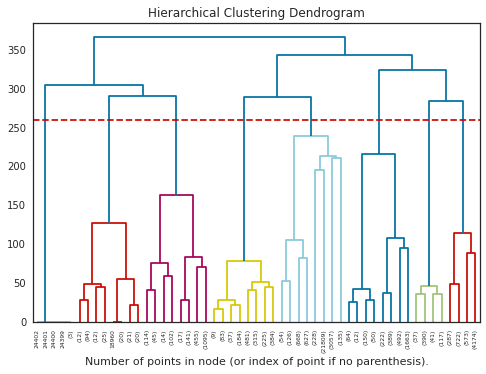

CPU times: user 1.43 s, sys: 340 ms, total: 1.77 s
Wall time: 1.23 s


In [37]:
%%time
title = "Hierarchical Clustering Dendrogram"
xlabel = "Number of points in node (or index of point if no parenthesis)."
# plot the top five levels of the dendrogram
plot_dendrogram(ac40k, title=title, xlabel=xlabel, y=260, truncate_mode="level", p=5)

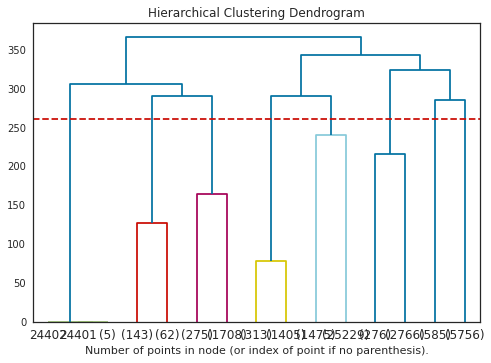

CPU times: user 497 ms, sys: 168 ms, total: 665 ms
Wall time: 367 ms


In [38]:
%%time
title = "Hierarchical Clustering Dendrogram"
xlabel = "Number of points in node (or index of point if no parenthesis)."
# plot the top three levels of the dendrogram
plot_dendrogram(ac40k, title=title, xlabel=xlabel, y=260, truncate_mode="level", p=3)

### Kmeans

In [15]:
%%time
# fitting K-means models
w = []
db_score = []
K = range(2,15)
for k in K:
    km = KMeans(n_clusters=k)
    km.fit(df_ss)
    # get inertia for Elbow Plot
    w.append(km.inertia_)
    km= km.predict(df_ss)
    # calculate Davies Bouldin score
    db_score.append(davies_bouldin_score(df_ss, km))

CPU times: user 2min 26s, sys: 24.5 s, total: 2min 51s
Wall time: 43.9 s


In [24]:
def plot_kmean_score_vs_n_clusters(K: range, metrics: list, title: str, y_label: str):
    plt.figure(figsize=(16, 8))
    plt.plot(K, metrics)
    plt.xlabel("Number of clusters")
    plt.ylabel(y_label)
    plt.title(title)

    plt.show()

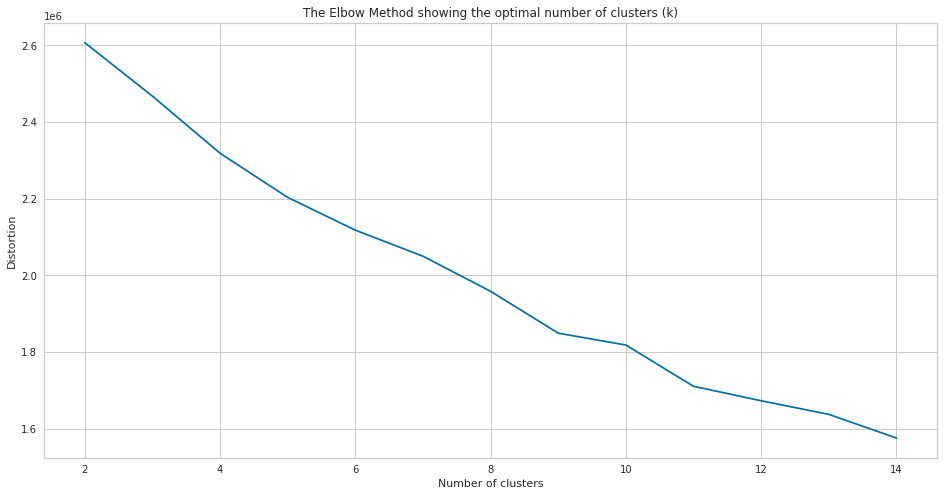

In [27]:
plot_kmean_score_vs_n_clusters(
    K,
    w,
    title="The Elbow Method showing the optimal number of clusters (k)",
    y_label="Distortion",
)

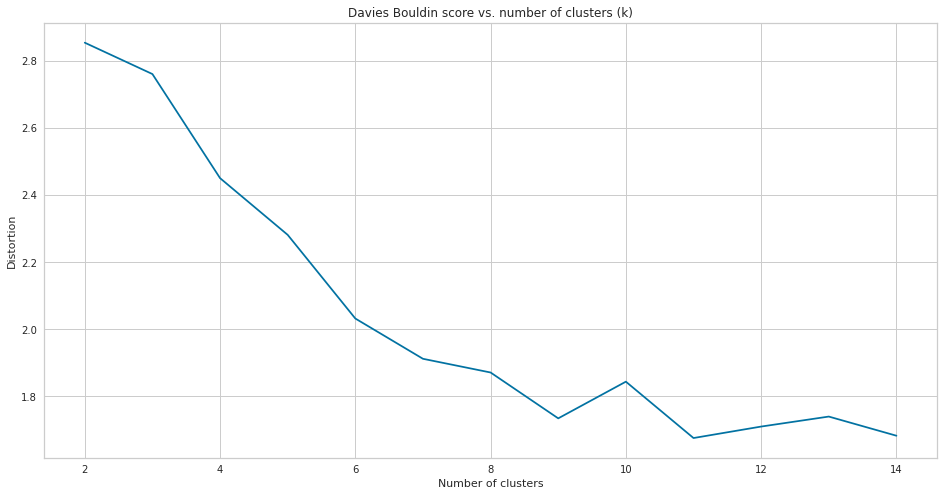

In [28]:
plot_kmean_score_vs_n_clusters(
    K,
    db_score,
    title="Davies Bouldin score vs. number of clusters (k)",
    y_label="Distortion",
)

In [41]:
def plot_kelbow_visualizer(df:pd.DataFrame, metric:str='distortion'):
    # Instantiate the clustering model and visualizer
    km = KMeans()
    visualizer = KElbowVisualizer(km, k=(2,15), metric=metric)

    visualizer.fit(df)    # Fit the data to the visualizer
    visualizer.poof()     # Draw/show/poof the data
    plt.show()

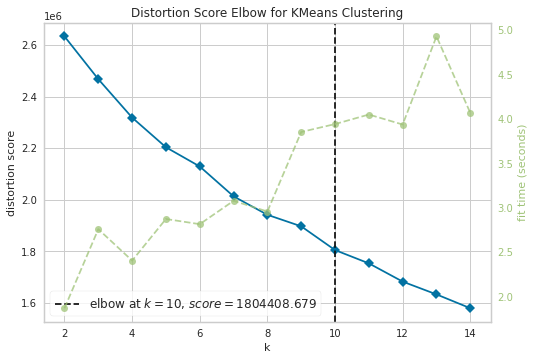

In [38]:
plot_kelbow_visualizer(df_ss)

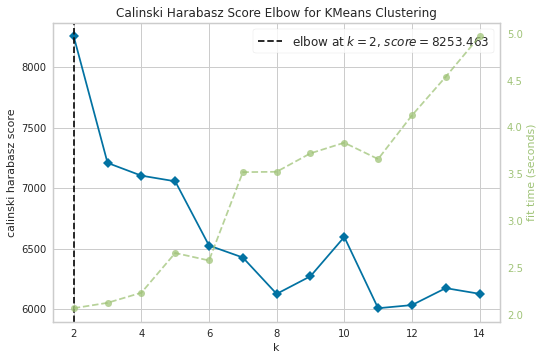

In [42]:
plot_kelbow_visualizer(df_ss, metric="calinski_harabasz")

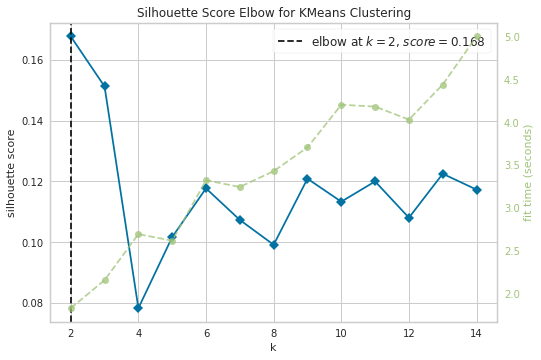

CPU times: user 39min 29s, sys: 14min 29s, total: 53min 58s
Wall time: 32min 20s


<AxesSubplot:title={'center':'Silhouette Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='silhouette score'>

In [39]:
%%time
# Instantiate the clustering model and visualizer
visualizer_km_silhouette = KElbowVisualizer(km, k=(2, 15), metric="silhouette")

visualizer_km_silhouette.fit(df_ss)  # Fit the data to the visualizer
visualizer_km_silhouette.poof()  # Draw/show/poof the data

In [55]:
def plot_silhouette(df, n_clusters:int):
    # Instantiate the clustering model and visualizer
    visualizer = SilhouetteVisualizer(KMeans(n_clusters))

    visualizer.fit(df)   # Fit the data to the visualizer
    visualizer.poof()    # Draw/show/poof the data

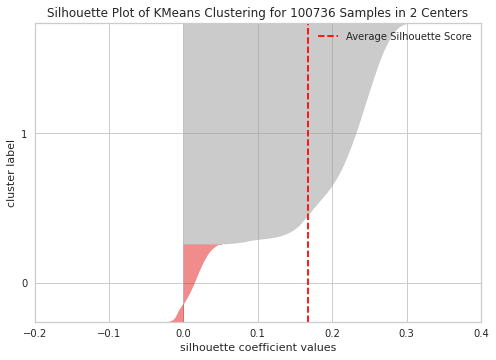

CPU times: user 6min 4s, sys: 2min 9s, total: 8min 13s
Wall time: 5min 9s


In [50]:
%%time
plot_silhouette(df_ss, n_clusters=2)

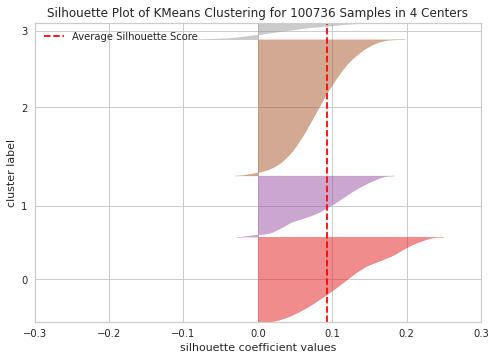

CPU times: user 5min 49s, sys: 2min 10s, total: 8min
Wall time: 4min 54s


In [51]:
%%time
plot_silhouette(df_ss, n_clusters=4)

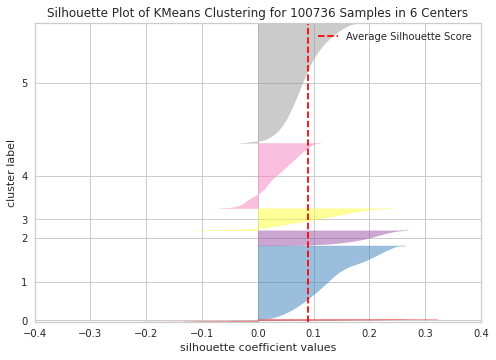

CPU times: user 5min 50s, sys: 2min 11s, total: 8min 1s
Wall time: 4min 52s


In [56]:
%%time
plot_silhouette(df_ss, n_clusters=6)

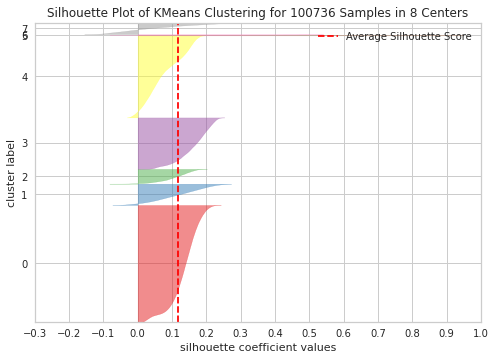

CPU times: user 5min 51s, sys: 2min 10s, total: 8min 2s
Wall time: 4min 52s


In [52]:
%%time
plot_silhouette(df_ss, n_clusters=8)

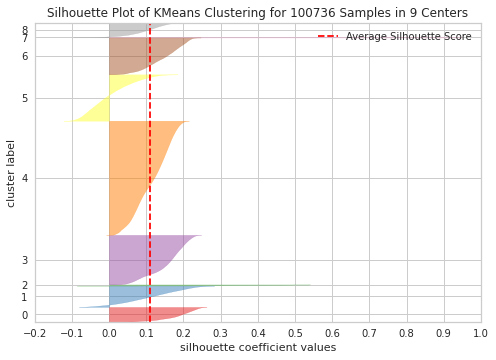

CPU times: user 5min 52s, sys: 2min 11s, total: 8min 3s
Wall time: 4min 53s


In [53]:
%%time
plot_silhouette(df_ss, n_clusters=9)

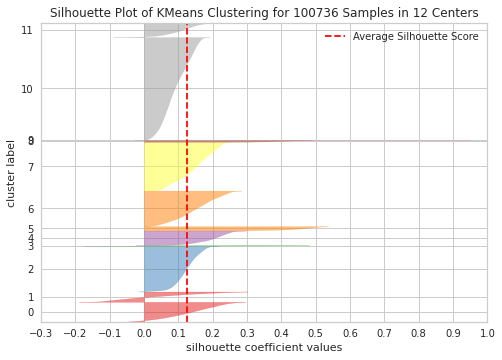

CPU times: user 5min 53s, sys: 2min 11s, total: 8min 5s
Wall time: 4min 52s


In [55]:
%%time
plot_silhouette(df_ss, n_clusters=12)

### DBSCAN

#### Cherche la Valeur EPS

In [63]:
def plot_k_distance_elbow(distances:np.ndarray, xmin:float=None, xmax:float=None, y_cutoff:int=None):
    
    plt.plot(distances)
    if y_cutoff:
        plt.axhline(y=y_cutoff, color='r', linestyle='--',xmin=0.05,xmax=0.95)
    if xmin and xmax:
        plt.xlim(xmin, xmax)

    plt.title('k-distance elbow plot:')
    plt.show()

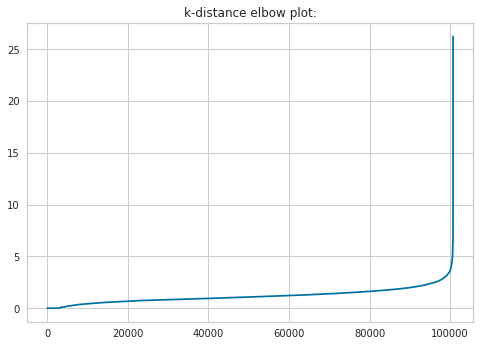

CPU times: user 320 ms, sys: 133 ms, total: 452 ms
Wall time: 179 ms


In [64]:
%%time
find the eps using NearestNeighbors
neighbors = NearestNeighbors(n_neighbors=29)
neighbors.fit(df_ss)
distances, indices = neighbors.kneighbors(df_ss)
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plot_k_distance_elbow(distances)

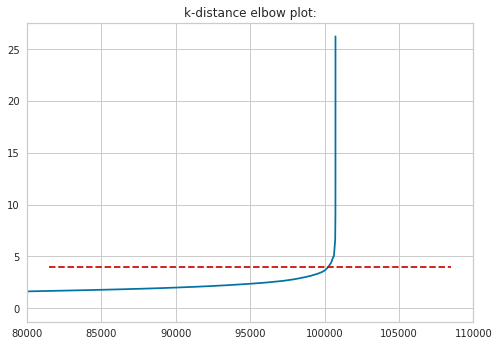

In [67]:
# zoom in plot
plot_k_distance_elbow(distances, xmin=80000, xmax=110000, y_cutoff=4)

#### DBSCAN

In [7]:
%%time
# instantiate and fit DBSCAN
db = DBSCAN(eps=4, min_samples=29)
db.fit(df_ss)

# crate sample mask and get labels
core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
labels = db.labels_

# calculate number of clusters
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_clusters_

CPU times: user 1min 51s, sys: 1min 9s, total: 3min
Wall time: 1min 29s


9

In [8]:
# calculate number of noise data points
n_noise_ = list(labels).count(-1)
n_noise_

1914

## Visualisation

### TSNE

#### iter = 2000

In [21]:
%%time
df_ss_tsne_2k = pd.DataFrame()
tsne_2k = TSNE(n_components=2, perplexity=50, n_iter=2000, init="pca")
tsne_2k = tsne_2k.fit_transform(df_ss)
df_ss_tsne_2k['dim_x'] = tsne_2k[:,0]
df_ss_tsne_2k['dim_y'] = tsne_2k[:,1]

/opt/conda/envs/test/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.

/opt/conda/envs/test/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning:

The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.



CPU times: user 1h 16min 34s, sys: 1min 19s, total: 1h 17min 54s
Wall time: 24min 38s


In [72]:
def calculate_kmeans(clusters:list, df:pd.DataFrame):
    kms = dict.fromkeys(clusters)
    for n_cluster in clusters:
        km = KMeans(n_clusters=n_cluster)
        kms[n_cluster] = km.fit(df)
    return kms

In [45]:
%time
kms = calculate_kmeans(clusters=[2, 4, 6, 8, 10, 12], df=df_ss)

CPU times: user 2 µs, sys: 0 ns, total: 2 µs
Wall time: 5.01 µs


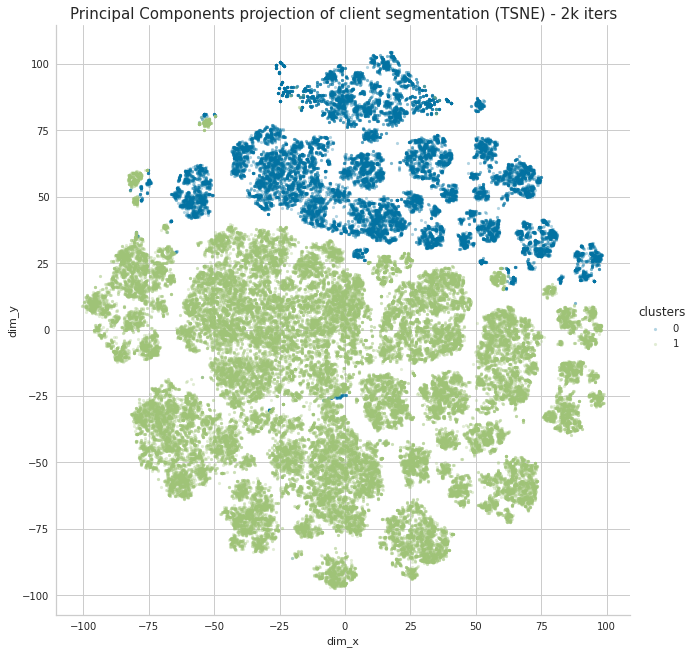

In [46]:
df_ss_tsne_2k["clusters"] = kms[2].labels_
plot_clusters(
    x="dim_x",
    y="dim_y",
    data=df_ss_tsne_2k,
    hue="clusters",
    title="Principal Components projection of client segmentation (TSNE) - 2k iters",
)

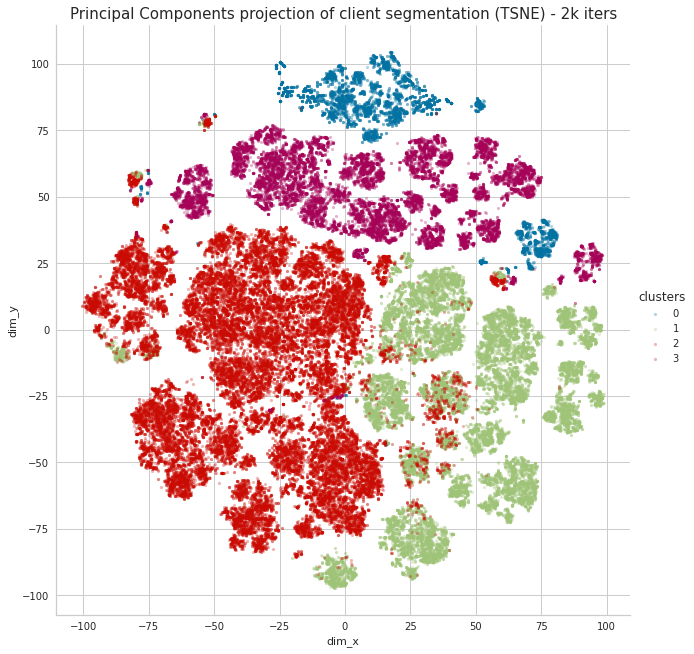

In [47]:
df_ss_tsne_2k["clusters"] = kms[4].labels_
plot_clusters(
    x="dim_x",
    y="dim_y",
    data=df_ss_tsne_2k,
    hue="clusters",
    title="Principal Components projection of client segmentation (TSNE) - 2k iters",
)

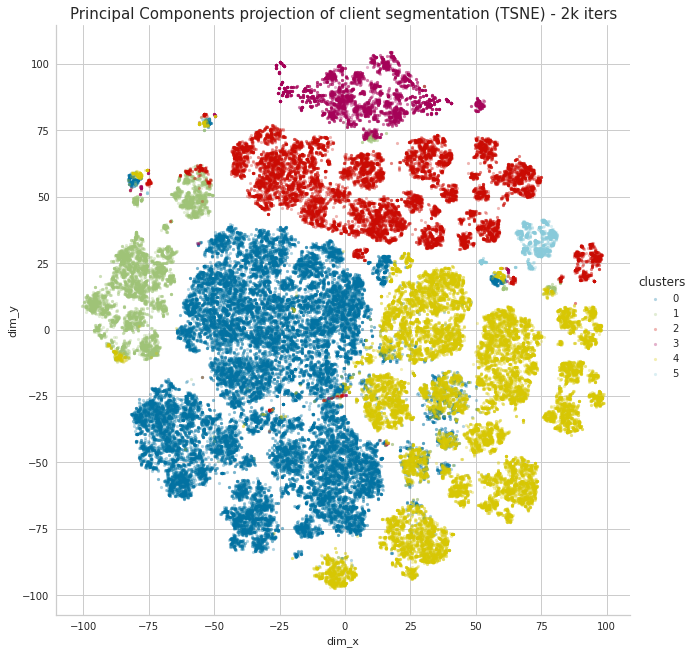

In [48]:
df_ss_tsne_2k["clusters"] = kms[6].labels_
plot_clusters(
    x="dim_x",
    y="dim_y",
    data=df_ss_tsne_2k,
    hue="clusters",
    title="Principal Components projection of client segmentation (TSNE) - 2k iters",
)

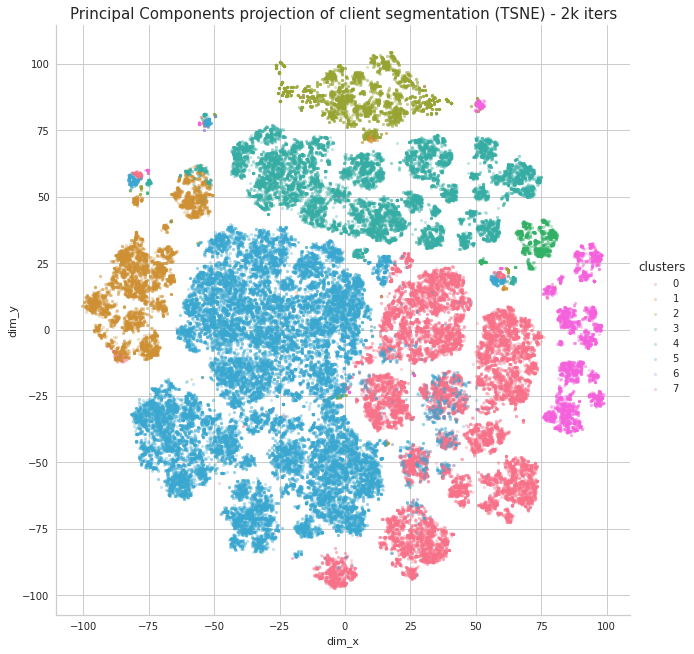

In [49]:
df_ss_tsne_2k["clusters"] = kms[8].labels_
plot_clusters(
    x="dim_x",
    y="dim_y",
    data=df_ss_tsne_2k,
    hue="clusters",
    title="Principal Components projection of client segmentation (TSNE) - 2k iters",
)

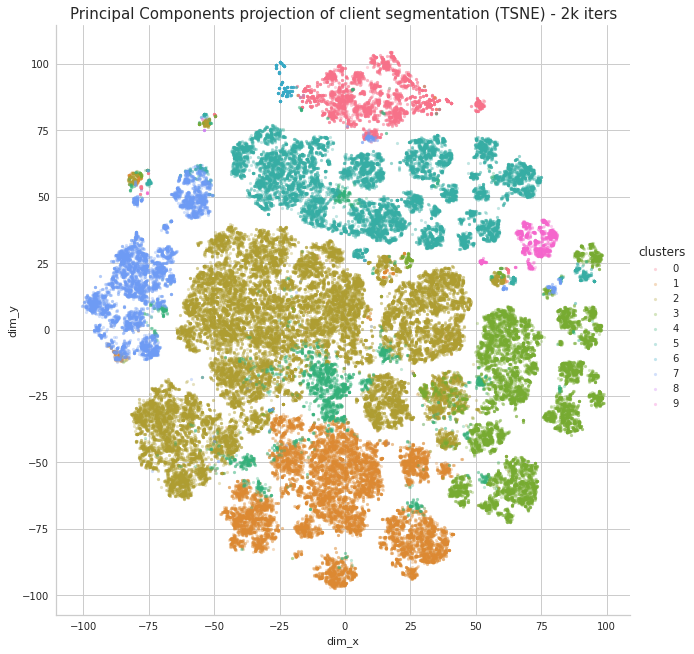

In [50]:
df_ss_tsne_2k["clusters"] = kms[10].labels_
plot_clusters(
    x="dim_x",
    y="dim_y",
    data=df_ss_tsne_2k,
    hue="clusters",
    title="Principal Components projection of client segmentation (TSNE) - 2k iters",
)

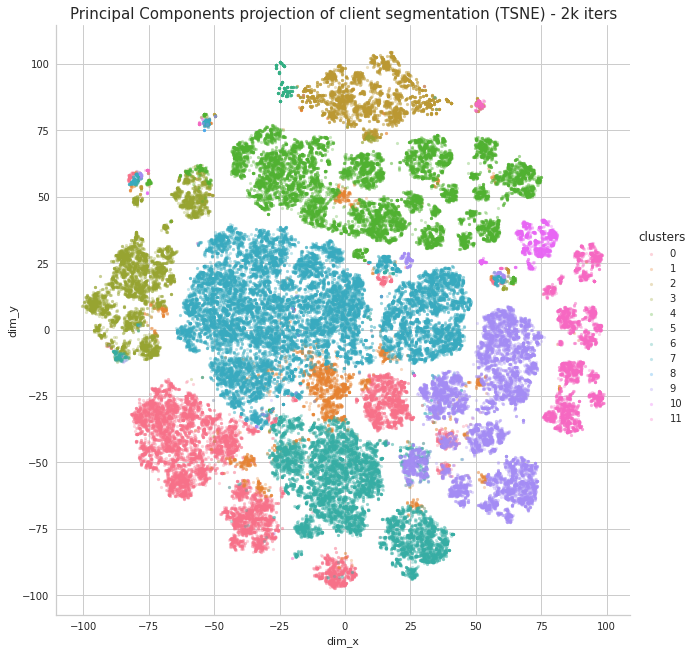

In [51]:
df_ss_tsne_2k["clusters"] = kms[12].labels_
plot_clusters(
    x="dim_x",
    y="dim_y",
    data=df_ss_tsne_2k,
    hue="clusters",
    title="Principal Components projection of client segmentation (TSNE) - 2k iters",
)

#### iter = 3000

In [29]:
%%time
df_ss_tsne_3k = pd.DataFrame()
tsne_3k = TSNE(n_components=2, perplexity=50, n_iter=3000, init="pca")
tsne_3k = tsne_3k.fit_transform(df_ss)
df_ss_tsne_3k['dim_x'] = tsne_3k[:,0]
df_ss_tsne_3k['dim_y'] = tsne_3k[:,1]

/opt/conda/envs/test/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.

/opt/conda/envs/test/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning:

The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.



CPU times: user 1h 49min 46s, sys: 1min 20s, total: 1h 51min 6s
Wall time: 34min 28s


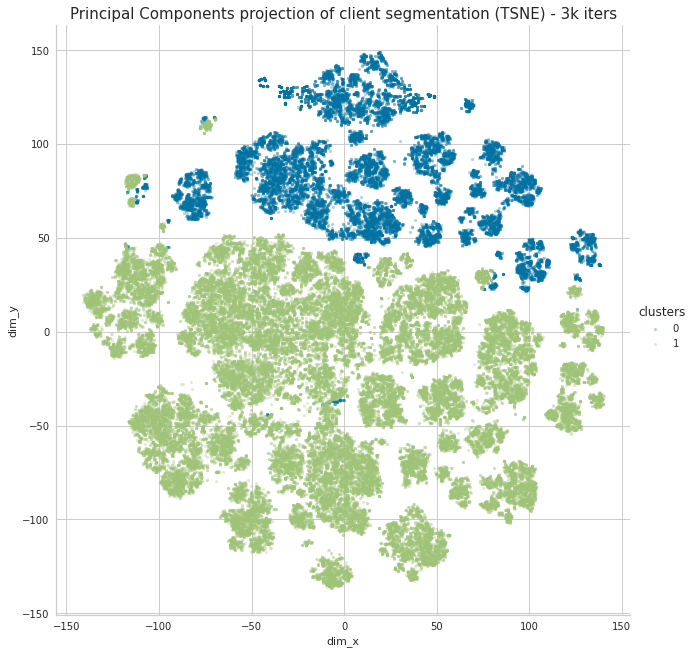

In [52]:
df_ss_tsne_3k["clusters"] = kms[2].labels_
plot_clusters(
    x="dim_x",
    y="dim_y",
    data=df_ss_tsne_3k,
    hue="clusters",
    title="Principal Components projection of client segmentation (TSNE) - 3k iters",
)

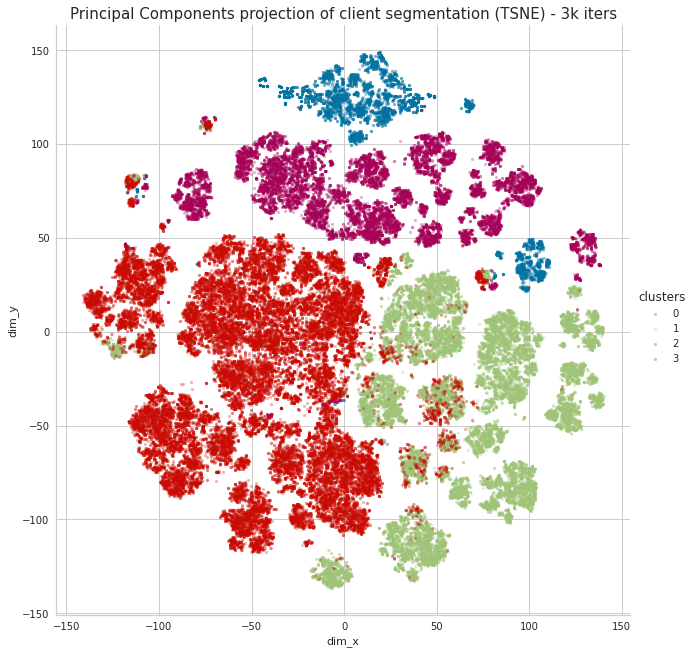

In [53]:
df_ss_tsne_3k["clusters"] = kms[4].labels_
plot_clusters(
    x="dim_x",
    y="dim_y",
    data=df_ss_tsne_3k,
    hue="clusters",
    title="Principal Components projection of client segmentation (TSNE) - 3k iters",
)

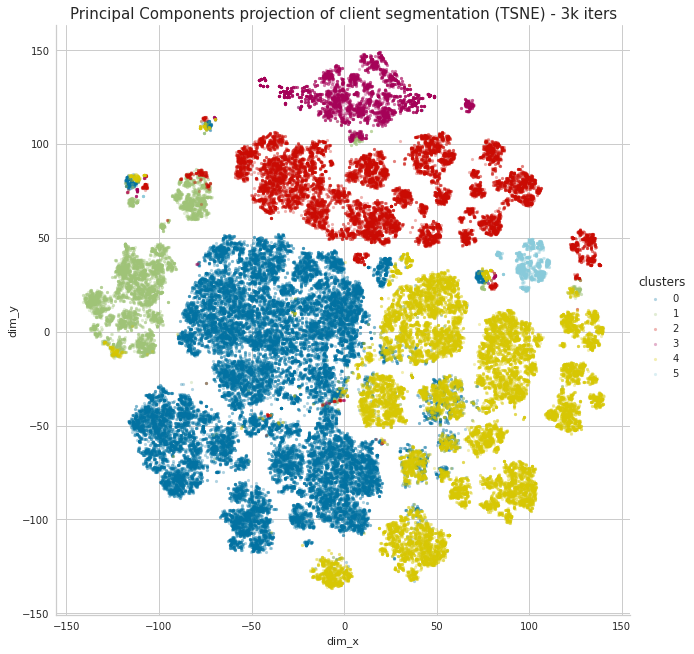

In [54]:
df_ss_tsne_3k["clusters"] = kms[6].labels_
plot_clusters(
    x="dim_x",
    y="dim_y",
    data=df_ss_tsne_3k,
    hue="clusters",
    title="Principal Components projection of client segmentation (TSNE) - 3k iters",
)

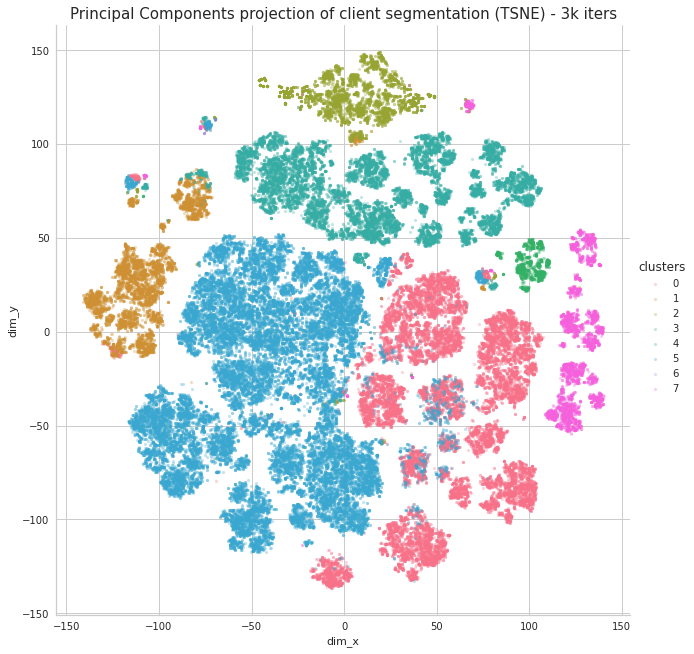

In [55]:
df_ss_tsne_3k["clusters"] = kms[8].labels_
plot_clusters(
    x="dim_x",
    y="dim_y",
    data=df_ss_tsne_3k,
    hue="clusters",
    title="Principal Components projection of client segmentation (TSNE) - 3k iters",
)

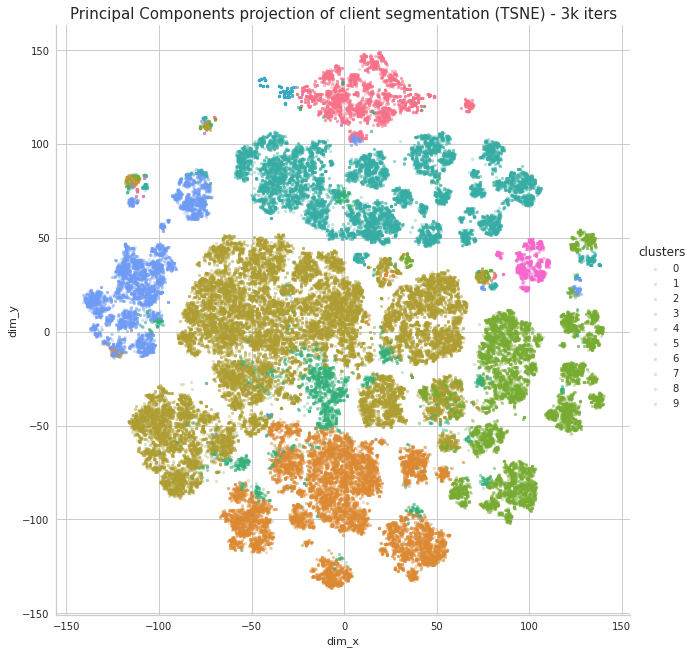

In [56]:
df_ss_tsne_3k["clusters"] = kms[10].labels_
plot_clusters(
    x="dim_x",
    y="dim_y",
    data=df_ss_tsne_3k,
    hue="clusters",
    title="Principal Components projection of client segmentation (TSNE) - 3k iters",
)

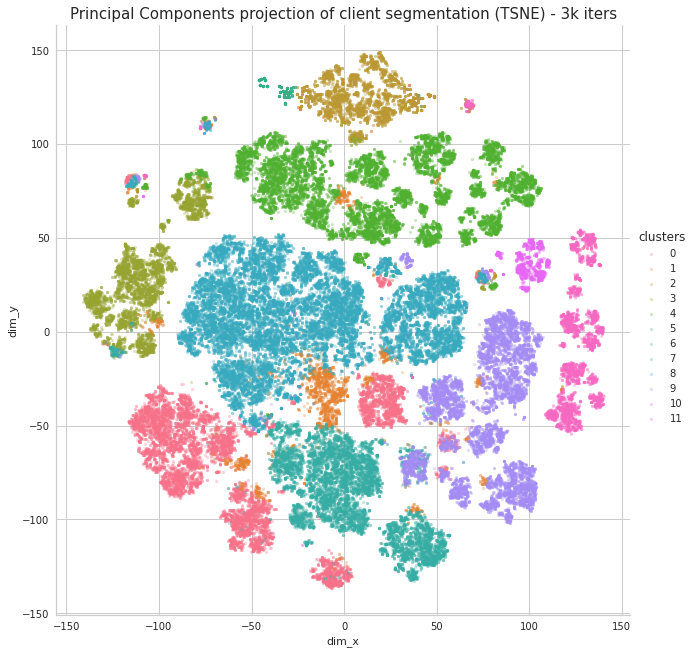

In [57]:
df_ss_tsne_3k["clusters"] = kms[12].labels_
plot_clusters(
    x="dim_x",
    y="dim_y",
    data=df_ss_tsne_3k,
    hue="clusters",
    title="Principal Components projection of client segmentation (TSNE) - 3k iters",
)

### UMAP

In [36]:
%%time
clusterable_embedding = umap.UMAP(
    n_neighbors=29,
    min_dist=0.0,
    n_components=2,
    random_state=42,
)
clusterable_embedding = clusterable_embedding.fit_transform(df_ss)

CPU times: user 10min 54s, sys: 2min 16s, total: 13min 11s
Wall time: 5min 8s


In [37]:
df_ss_umap = pd.DataFrame()
df_ss_umap['dim_x'] = clusterable_embedding[:, 0]
df_ss_umap['dim_y'] = clusterable_embedding[:, 1]

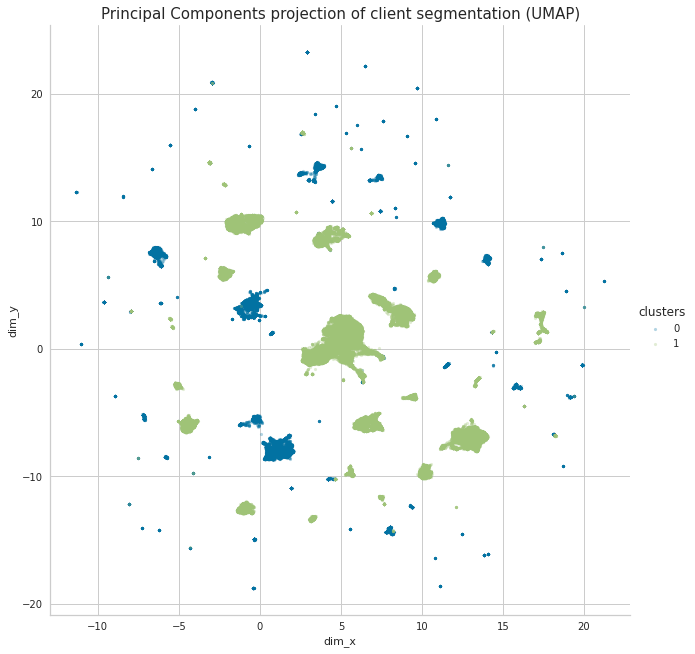

In [38]:
df_ss_umap["clusters"] = kms[2].labels_
plot_clusters(
    x="dim_x",
    y="dim_y",
    data=df_ss_umap,
    hue="clusters",
    title="Principal Components projection of client segmentation (UMAP)",
)

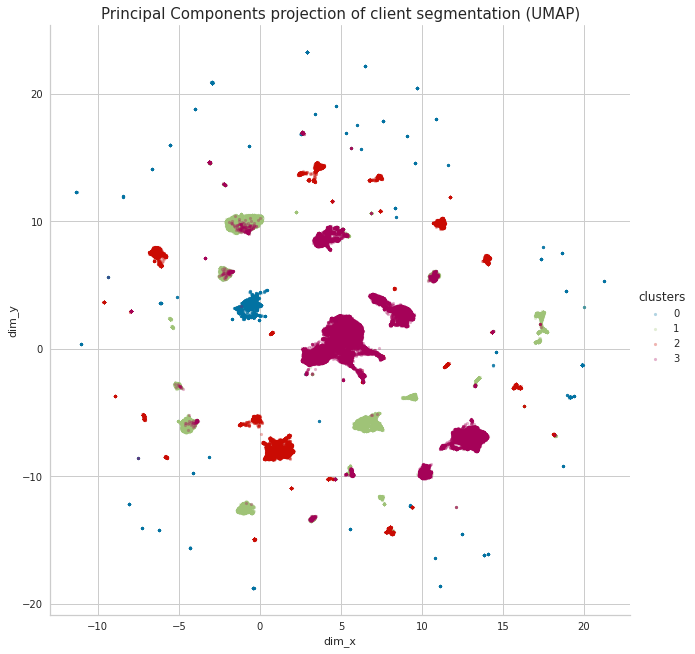

In [39]:
df_ss_umap["clusters"] = kms[4].labels_
plot_clusters(
    x="dim_x",
    y="dim_y",
    data=df_ss_umap,
    hue="clusters",
    title="Principal Components projection of client segmentation (UMAP)",
)

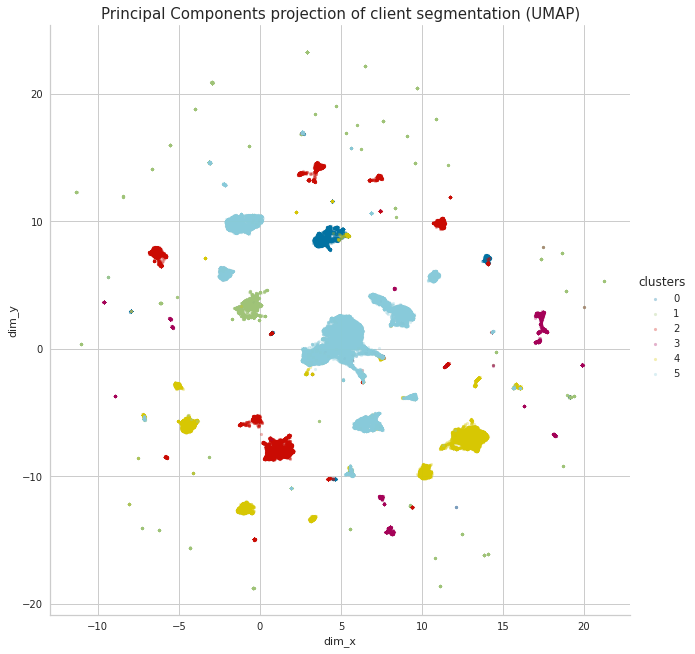

In [40]:
df_ss_umap["clusters"] = kms[6].labels_
plot_clusters(
    x="dim_x",
    y="dim_y",
    data=df_ss_umap,
    hue="clusters",
    title="Principal Components projection of client segmentation (UMAP)",
)

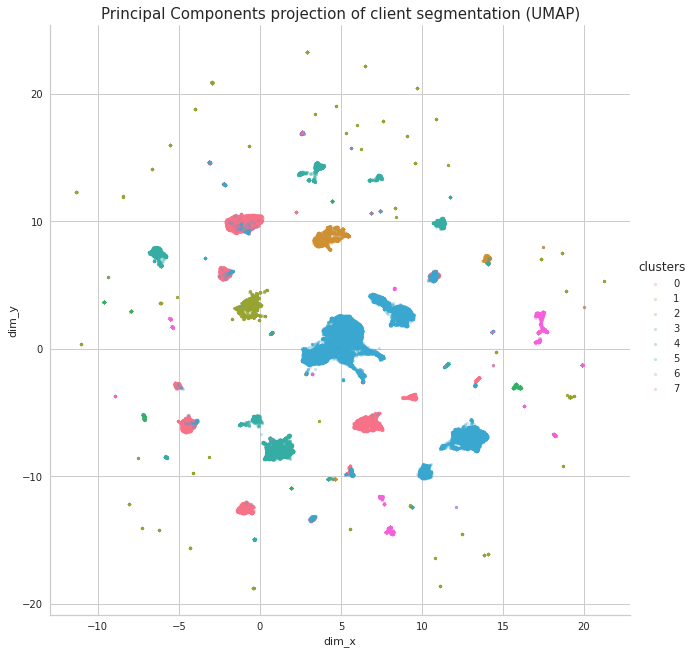

In [69]:
df_ss_umap["clusters"] = kms[8].labels_
plot_clusters(
    x="dim_x",
    y="dim_y",
    data=df_ss_umap,
    hue="clusters",
    title="Principal Components projection of client segmentation (UMAP)",
)

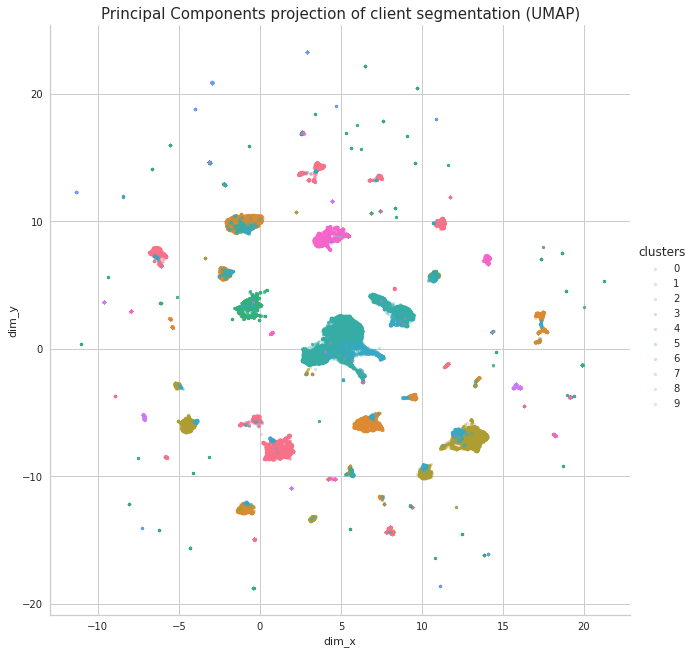

In [42]:
df_ss_umap["clusters"] = kms[10].labels_
plot_clusters(
    x="dim_x",
    y="dim_y",
    data=df_ss_umap,
    hue="clusters",
    title="Principal Components projection of client segmentation (UMAP)",
)

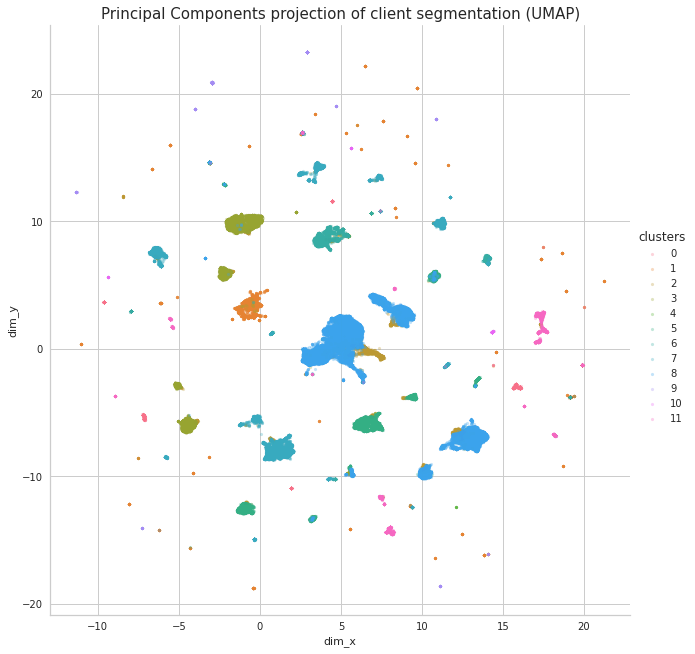

In [43]:
df_ss_umap["clusters"] = kms[12].labels_
plot_clusters(
    x="dim_x",
    y="dim_y",
    data=df_ss_umap,
    hue="clusters",
    title="Principal Components projection of client segmentation (UMAP)",
)

## Anaylse des Clusters

### 6 Clusters

In [60]:
df_analyse_ss = df_ss.copy()
df_analyse_ss['clusters'] =kms[6].labels_

In [61]:
clusters_ss = {}
for cluster in range(6):
    clusters_ss[cluster] = list(
        df_analyse_ss[df_analyse_ss.clusters == cluster].iloc[:, :-1].mean().values
    )
    clusters_ss[cluster] = [*clusters_ss[cluster], clusters_ss[cluster][0]]

In [62]:
%%time
plot_radar(clusters_ss[0], title='Client Segmentation - cluster 0')

CPU times: user 94.7 ms, sys: 19.9 ms, total: 115 ms
Wall time: 235 ms


**Cluster 0**<br>
Regional buyers and credit card users with installments. 

In [63]:
%%time
plot_radar(clusters_ss[1], title='Client Segmentation - cluster 1')

CPU times: user 6.87 ms, sys: 0 ns, total: 6.87 ms
Wall time: 5.89 ms


**Cluster 1**<br>
Unhappy buyers, probably due to long delivery time and sellers do not repect delivery date.

In [64]:
%%time
plot_radar(clusters_ss[2], title='Client Segmentation - cluster 2')

CPU times: user 6.73 ms, sys: 0 ns, total: 6.73 ms
Wall time: 5.79 ms


**Cluster 2**<br>
Boleto users

In [65]:
%%time
plot_radar(clusters_ss[3], title='Client Segmentation - cluster 3')

CPU times: user 7.27 ms, sys: 0 ns, total: 7.27 ms
Wall time: 6.18 ms


**Cluster 3**<br>
Careful and economical buyers: <br>
- bindle buyers
- study well the product (long product name)

In [66]:
%%time
plot_radar(clusters_ss[4], title='Client Segmentation - cluster 4')

CPU times: user 6.73 ms, sys: 0 ns, total: 6.73 ms
Wall time: 5.8 ms


**Cluster 4**<br>
"Neiborhood" buyers

In [67]:
%%time
plot_radar(clusters_ss[5], title='Client Segmentation - cluster 5')

CPU times: user 0 ns, sys: 6.3 ms, total: 6.3 ms
Wall time: 5.44 ms


**Cluster 5**<br>
Debit card users


# MinMax Scaler

In [10]:
mmscaler = MinMaxScaler()
df_mmss = pd.DataFrame(mmscaler.fit_transform(df), columns=df.columns)
df_mmss.describe()

,product_name_length,product_description_length,product_photos_qty,payment_installments,number_of_reviews,review_score,price_log,distance,freight_price_ratio,delivery_time_days,...,same_city,same_state,weekend,holiday,order_status,product_category_label,payment_type_boleto,payment_type_credit_card,payment_type_debit_card,payment_type_voucher
count,100736.000000,100736.000000,100736.000000,100736.000000,100736.000000,100736.000000,100736.000000,100736.000000,100736.000000,100736.000000,...,100736.000000,100736.000000,100736.000000,100736.000000,100736.000000,100736.000000,100736.000000,100736.000000,100736.000000,100736.000000
mean,0.634032,0.195607,0.110854,0.118820,0.332979,0.825364,0.503199,0.062781,0.680102,0.057925,...,0.051044,0.359147,0.229372,0.702837,0.999940,0.218006,0.190468,0.740282,0.014742,0.054509
std,0.150975,0.164290,0.087617,0.111852,0.037174,0.264847,0.102785,0.073226,0.016747,0.045721,...,0.220089,0.479753,0.420431,0.457011,0.007717,0.230389,0.392672,0.438482,0.120517,0.227020
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.552632,0.085421,0.050000,0.041667,0.333333,0.800000,0.432645,0.005910,0.671405,0.028708,...,0.000000,0.000000,0.000000,0.000000,1.000000,0.052632,0.000000,0.000000,0.000000,0.000000
50%,0.684211,0.150050,0.050000,0.041667,0.333333,1.000000,0.504809,0.042743,0.676322,0.047847,...,0.000000,0.000000,0.000000,1.000000,1.000000,0.157895,0.000000,1.000000,0.000000,0.000000
75%,0.750000,0.246994,0.150000,0.166667,0.333333,1.000000,0.568361,0.087483,0.683018,0.071770,...,0.000000,1.000000,0.000000,1.000000,1.000000,0.368421,0.000000,1.000000,0.000000,0.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


## Clustering
### Clustering Hiérarchique

In [11]:
df_mmss.sample(5)

,product_name_length,product_description_length,product_photos_qty,payment_installments,number_of_reviews,review_score,price_log,distance,freight_price_ratio,delivery_time_days,...,same_city,same_state,weekend,holiday,order_status,product_category_label,payment_type_boleto,payment_type_credit_card,payment_type_debit_card,payment_type_voucher
79394,0.684211,0.212174,0.15,0.416667,0.333333,0.6,0.519317,0.297831,0.682821,0.177033,...,0.0,0.0,1.0,0.0,1.0,0.421053,0.0,1.0,0.0,0.0
24874,0.631579,0.184870,0.20,0.083333,0.333333,0.2,0.442121,0.016364,0.674396,0.033493,...,0.0,1.0,0.0,1.0,1.0,0.526316,0.0,1.0,0.0,0.0
10937,0.710526,0.376754,0.10,0.083333,0.333333,1.0,0.483064,0.000842,0.676919,0.009569,...,1.0,1.0,1.0,1.0,1.0,0.210526,0.0,1.0,0.0,0.0
74731,0.486842,0.055611,0.05,0.333333,0.333333,0.8,0.719937,0.107114,0.673499,0.105263,...,0.0,0.0,0.0,1.0,1.0,0.157895,0.0,1.0,0.0,0.0
91793,0.697368,0.769289,0.10,0.083333,0.333333,0.8,0.482204,0.297378,0.705681,0.047847,...,0.0,0.0,0.0,0.0,1.0,0.105263,0.0,1.0,0.0,0.0


In [12]:
%%time
# setting distance_threshold=0 ensures we compute the full tree.
ac_40k_mmss = AgglomerativeClustering(distance_threshold=0, n_clusters=None)
ac_40k_mmss = ac_40k_mmss.fit(df_mmss.sample(40000))

CPU times: user 1min 6s, sys: 2.37 s, total: 1min 8s
Wall time: 1min 8s


In [17]:
# with open('model/agglo_cluster_40k_mmss.pkl', 'wb') as f:
#     pickle.dump(ac_40k_mmss, f)

In [ ]:
# with open('model/agglo_cluster_40k_mmss.pkl', 'rb') as f:
#     pickle.load(ac_60k_mmss, f)

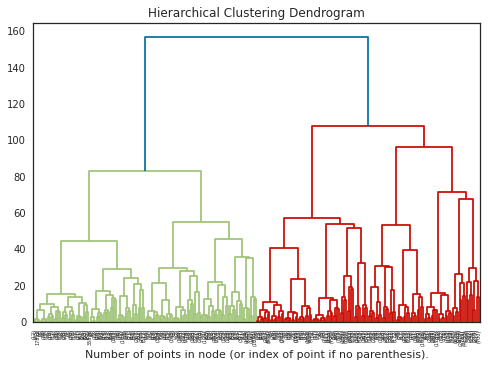

CPU times: user 4.09 s, sys: 496 ms, total: 4.58 s
Wall time: 4.04 s


In [49]:
%%time
title = "Hierarchical Clustering Dendrogram"
xlabel = "Number of points in node (or index of point if no parenthesis)."
# plot the top seven levels of the dendrogram
plot_dendrogram(ac_40k_mmss, title=title, xlabel=xlabel, y=250, truncate_mode="level", p=7)

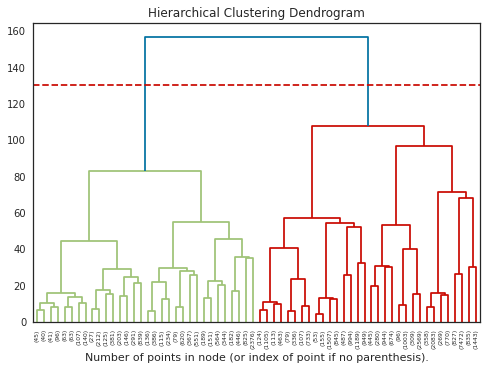

CPU times: user 1.53 s, sys: 406 ms, total: 1.93 s
Wall time: 1.4 s


In [52]:
%%time
title = "Hierarchical Clustering Dendrogram"
xlabel = "Number of points in node (or index of point if no parenthesis)."
# plot the top five levels of the dendrogram
plot_dendrogram(ac_40k_mmss, title=title, xlabel=xlabel, y=130, truncate_mode="level", p=5)

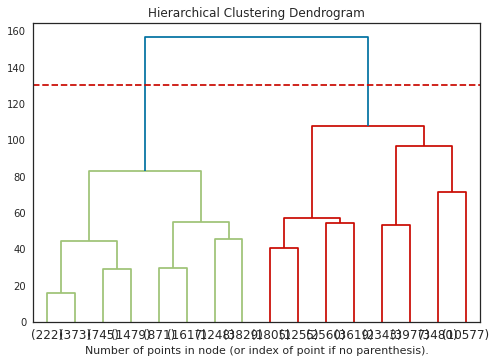

CPU times: user 588 ms, sys: 184 ms, total: 772 ms
Wall time: 420 ms


In [53]:
%%time
title = "Hierarchical Clustering Dendrogram"
xlabel = "Number of points in node (or index of point if no parenthesis)."
# plot the top three levels of the dendrogram
plot_dendrogram(ac_40k_mmss, title=title, xlabel=xlabel, y=130, truncate_mode="level", p=3)

### Kmeans

In [32]:
%%time
# fitting K-means models
w = []
db_score = []
K = range(2,15)
for k in K:
    km = KMeans(n_clusters=k)
    km.fit(df_mmss)
    # get inertia for Elbow Plot
    w.append(km.inertia_)
    km= km.predict(df_mmss)
    # calculate Davies Bouldin score
    db_score.append(davies_bouldin_score(df_mmss, km))

CPU times: user 1min 39s, sys: 25 s, total: 2min 4s
Wall time: 32 s


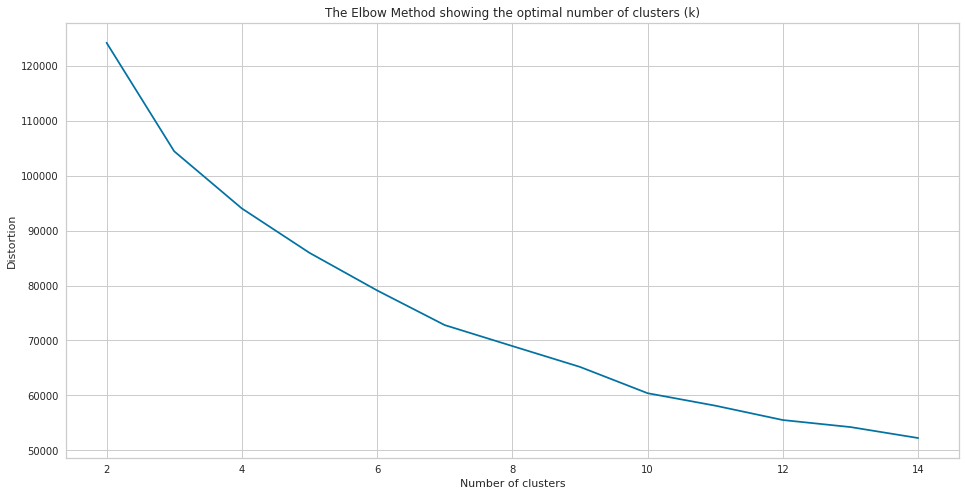

In [33]:
plot_kmean_score_vs_n_clusters(
    K,
    w,
    title="The Elbow Method showing the optimal number of clusters (k)",
    y_label="Distortion",
)

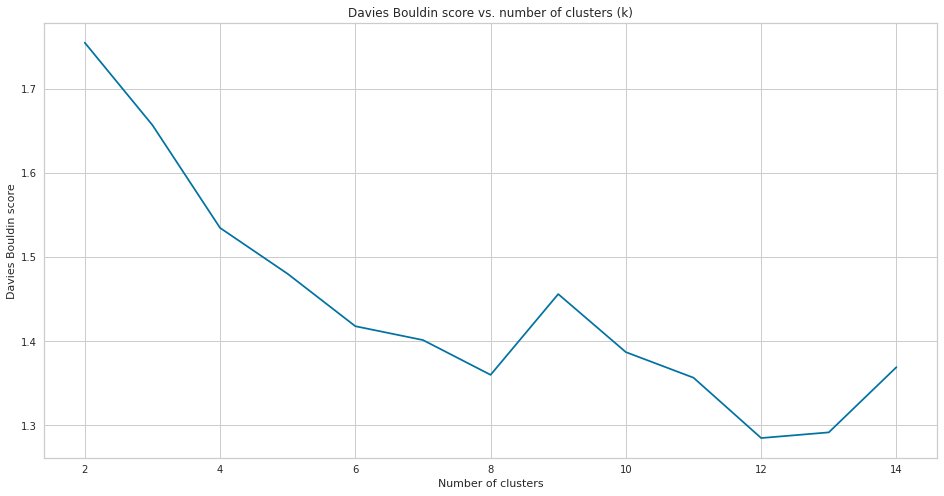

In [34]:
plot_kmean_score_vs_n_clusters(
    K,
    db_score,
    title='Davies Bouldin score vs. number of clusters (k)',
    y_label='Davies Bouldin score',
)

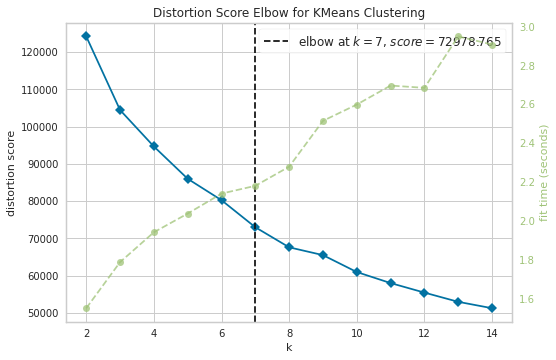

In [43]:
plot_kelbow_visualizer(df_mmss)

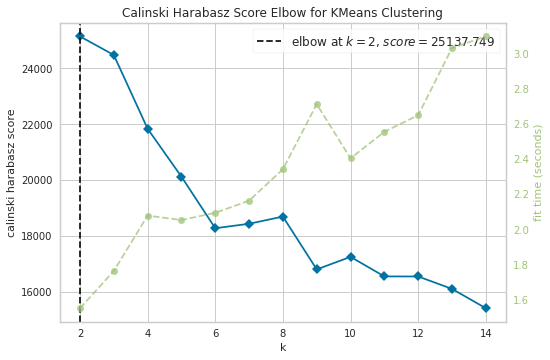

In [44]:
plot_kelbow_visualizer(df_mmss, metric="calinski_harabasz")

In [46]:
# plot_kelbow_visualizer(df_mmss, metric="silhouette")

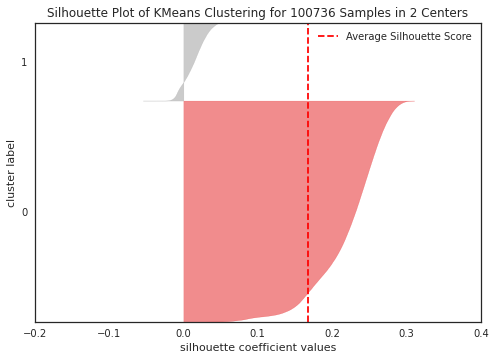

CPU times: user 6min 4s, sys: 2min 11s, total: 8min 16s
Wall time: 5min 10s


In [56]:
%%time
plot_silhouette(df_ss, n_clusters=2)

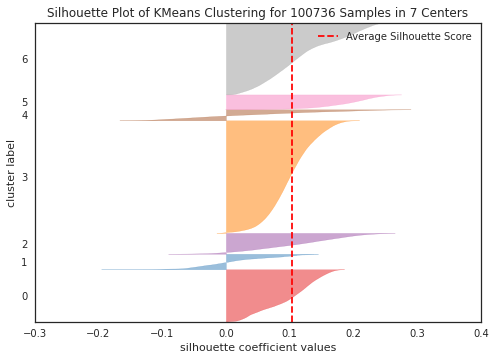

CPU times: user 5min 51s, sys: 2min 11s, total: 8min 3s
Wall time: 4min 53s


In [57]:
%%time
plot_silhouette(df_ss, n_clusters=7)

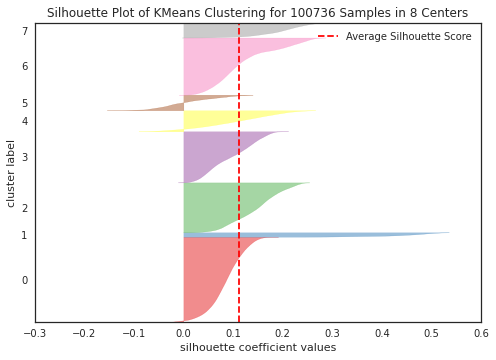

CPU times: user 5min 49s, sys: 2min 11s, total: 8min 1s
Wall time: 4min 51s


In [58]:
%%time
plot_silhouette(df_ss, n_clusters=8)

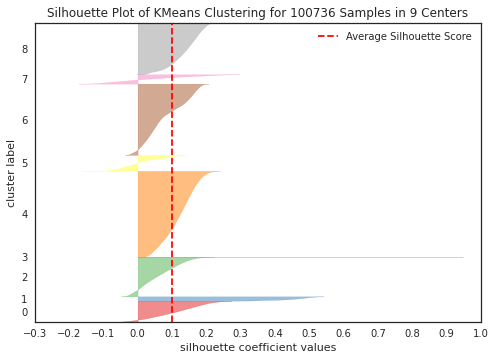

CPU times: user 5min 49s, sys: 2min 12s, total: 8min 2s
Wall time: 4min 51s


In [59]:
%%time
plot_silhouette(df_ss, n_clusters=9)

### DBSCAN

#### Cherche la Valeur EPS

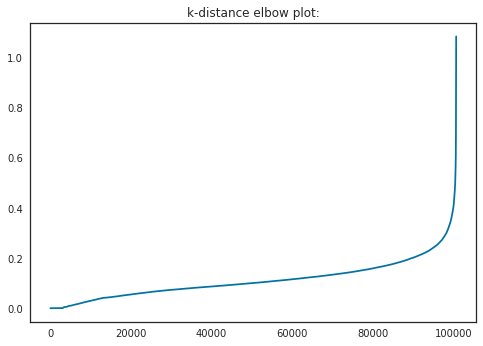

CPU times: user 3min 12s, sys: 1min 17s, total: 4min 29s
Wall time: 3min 1s


In [64]:
%%time
# find the eps using NearestNeighbors
neighbors = NearestNeighbors(n_neighbors=29)
neighbors.fit(df_mmss)
distances, indices = neighbors.kneighbors(df_mmss)
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plot_k_distance_elbow(distances)

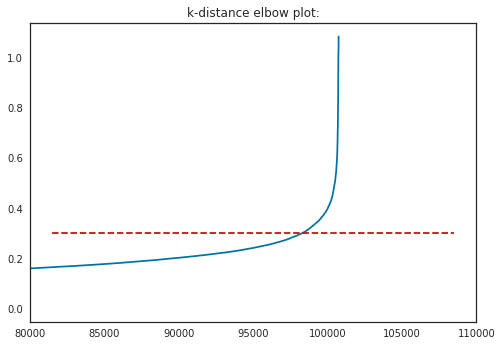

In [65]:
# zoom in plot
plot_k_distance_elbow(distances, xmin=80000, xmax=110000, y_cutoff=0.3)

#### DBSCAN

In [66]:
%%time
# instantiate and fit DBSCAN
db = DBSCAN(eps=0.3, min_samples=29)
db.fit(df_mmss)

# crate sample mask and get labels
core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
labels = db.labels_

# calculate number of clusters
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_clusters_

CPU times: user 1min 40s, sys: 1min 5s, total: 2min 45s
Wall time: 1min 15s


90

In [67]:
# calculate number of noise data points
n_noise_ = list(labels).count(-1)
n_noise_

6443

## Visualisation

### TSNE

#### iter = 3000

In [68]:
%%time
df_mmss_tsne_3k = pd.DataFrame()
tsne_3k = TSNE(n_components=2, perplexity=50, n_iter=3000, init="pca")
tsne_3k = tsne_3k.fit_transform(df_mmss)
df_mmss_tsne_3k['dim_x'] = tsne_3k[:,0]
df_mmss_tsne_3k['dim_y'] = tsne_3k[:,1]

/opt/conda/envs/test/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.

/opt/conda/envs/test/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning:

The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.



CPU times: user 1h 39min 19s, sys: 1min 19s, total: 1h 40min 39s
Wall time: 32min 33s


In [76]:
%time
kms = calculate_kmeans(clusters=[2, 7, 8, 9], df=df_mmss)

CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 5.48 µs


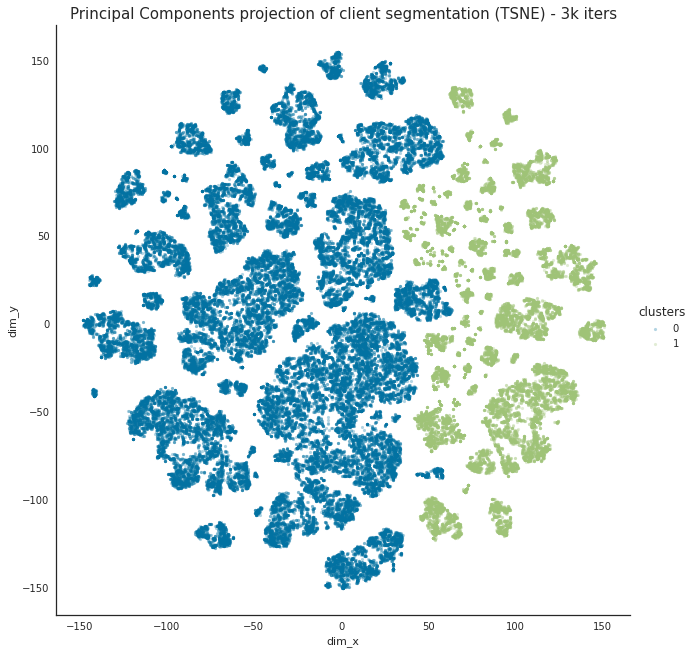

In [74]:
df_mmss_tsne_3k["clusters"] = kms[2].labels_
plot_clusters(
    x="dim_x",
    y="dim_y",
    data=df_mmss_tsne_3k,
    hue="clusters",
    title="Principal Components projection of client segmentation (TSNE) - 3k iters",
)

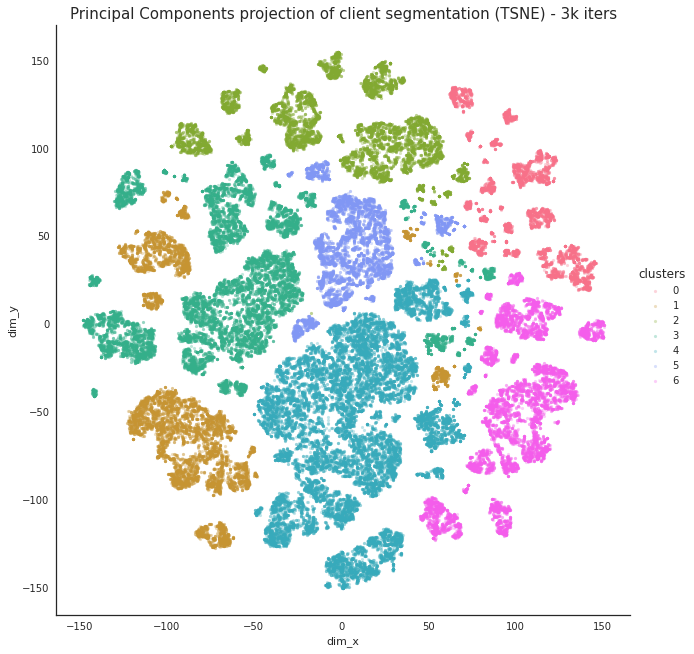

In [77]:
df_mmss_tsne_3k["clusters"] = kms[7].labels_
plot_clusters(
    x="dim_x",
    y="dim_y",
    data=df_mmss_tsne_3k,
    hue="clusters",
    title="Principal Components projection of client segmentation (TSNE) - 3k iters",
)

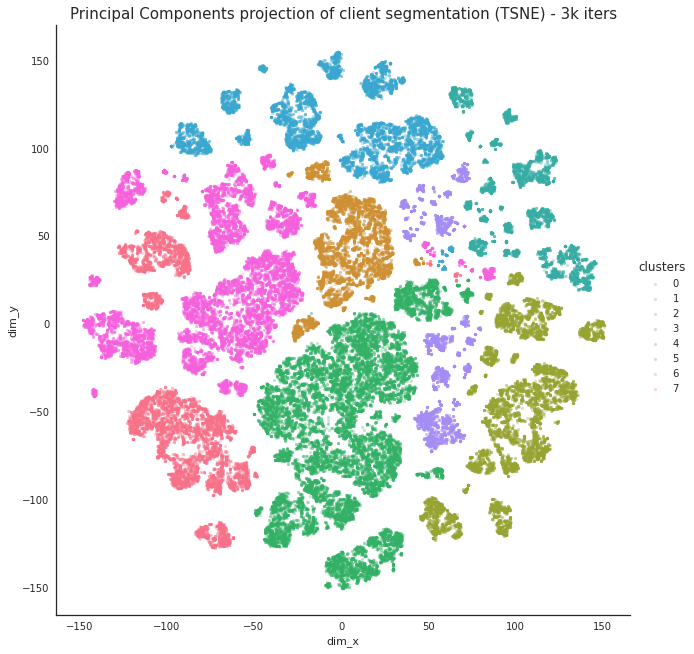

In [78]:
df_mmss_tsne_3k["clusters"] = kms[8].labels_
plot_clusters(
    x="dim_x",
    y="dim_y",
    data=df_mmss_tsne_3k,
    hue="clusters",
    title="Principal Components projection of client segmentation (TSNE) - 3k iters",
)

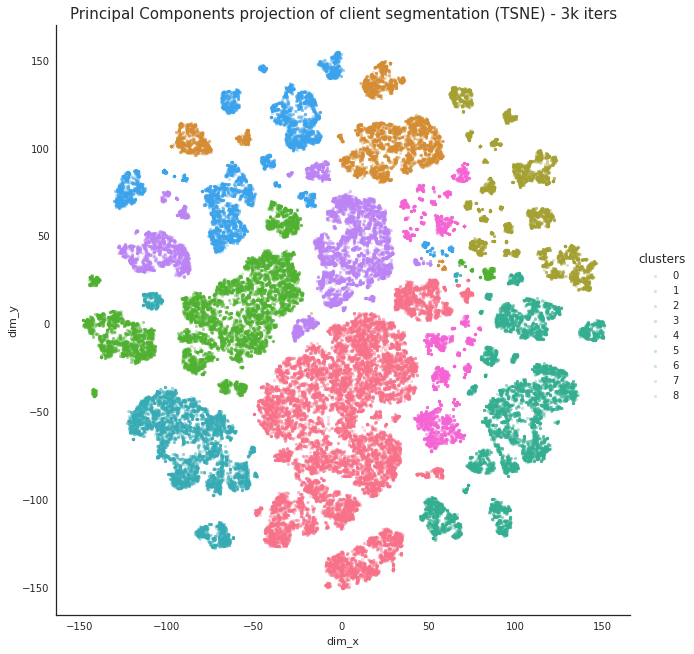

In [79]:
df_mmss_tsne_3k["clusters"] = kms[9].labels_
plot_clusters(
    x="dim_x",
    y="dim_y",
    data=df_mmss_tsne_3k,
    hue="clusters",
    title="Principal Components projection of client segmentation (TSNE) - 3k iters",
)

### UMAP

In [80]:
%%time
clusterable_embedding = umap.UMAP(
    n_neighbors=29,
    min_dist=0.0,
    n_components=2,
    random_state=42,
)
clusterable_embedding = clusterable_embedding.fit_transform(df_mmss)

CPU times: user 6min 53s, sys: 1min 47s, total: 8min 41s
Wall time: 3min 55s


In [81]:
df_mmss_umap = pd.DataFrame()
df_mmss_umap['dim_x'] = clusterable_embedding[:, 0]
df_mmss_umap['dim_y'] = clusterable_embedding[:, 1]

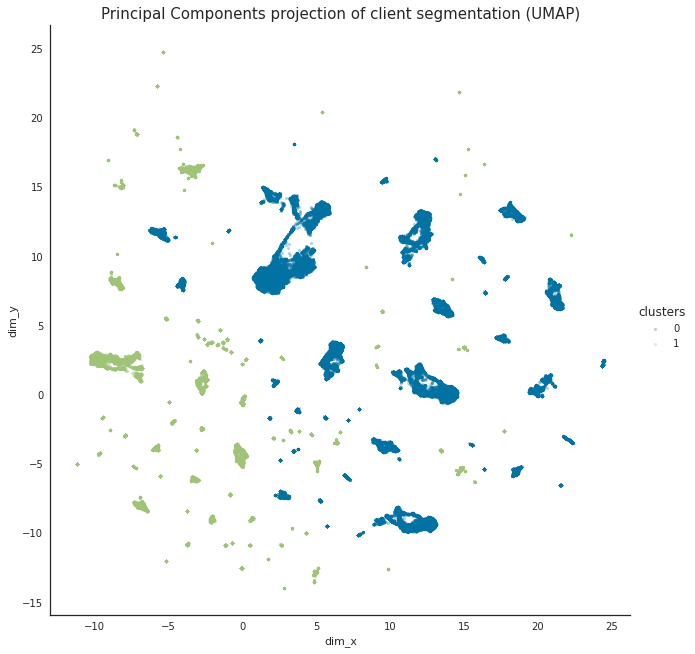

In [82]:
df_mmss_umap["clusters"] = kms[2].labels_
plot_clusters(
    x="dim_x",
    y="dim_y",
    data=df_mmss_umap,
    hue="clusters",
    title="Principal Components projection of client segmentation (UMAP)",
)

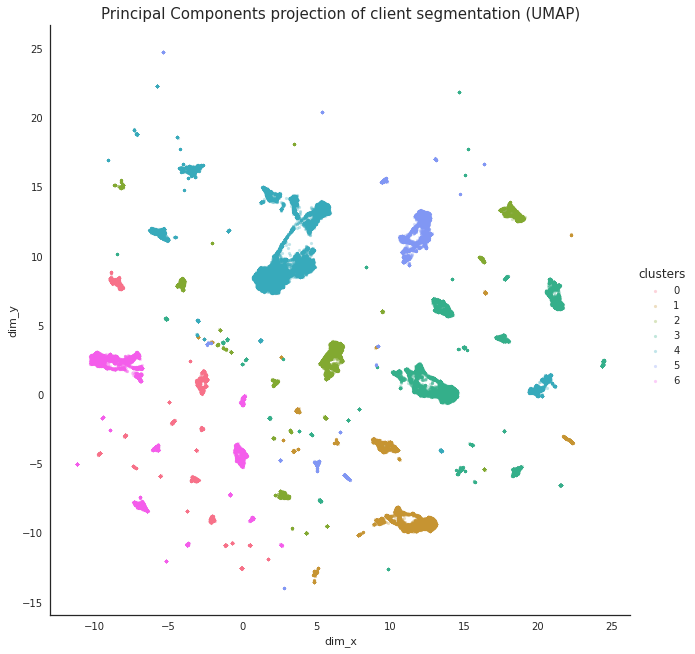

In [83]:
df_mmss_umap["clusters"] = kms[7].labels_
plot_clusters(
    x="dim_x",
    y="dim_y",
    data=df_mmss_umap,
    hue="clusters",
    title="Principal Components projection of client segmentation (UMAP)",
)

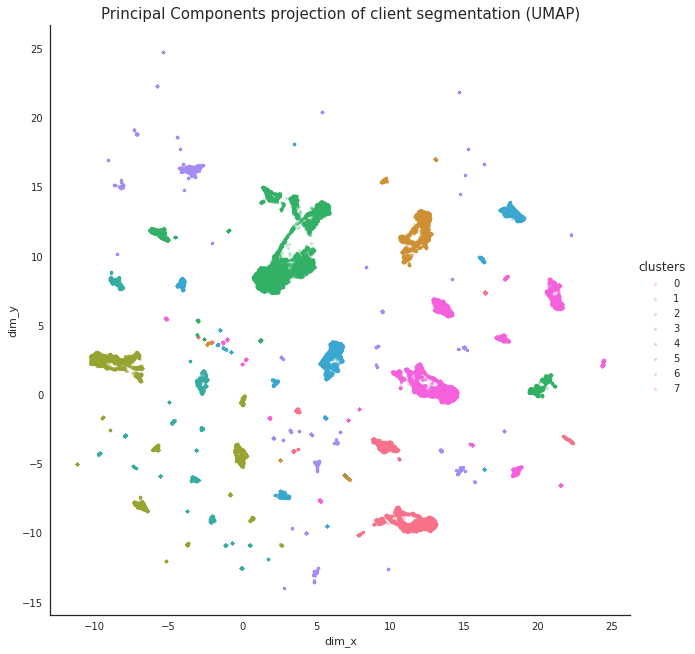

In [84]:
df_mmss_umap["clusters"] = kms[8].labels_
plot_clusters(
    x="dim_x",
    y="dim_y",
    data=df_mmss_umap,
    hue="clusters",
    title="Principal Components projection of client segmentation (UMAP)",
)

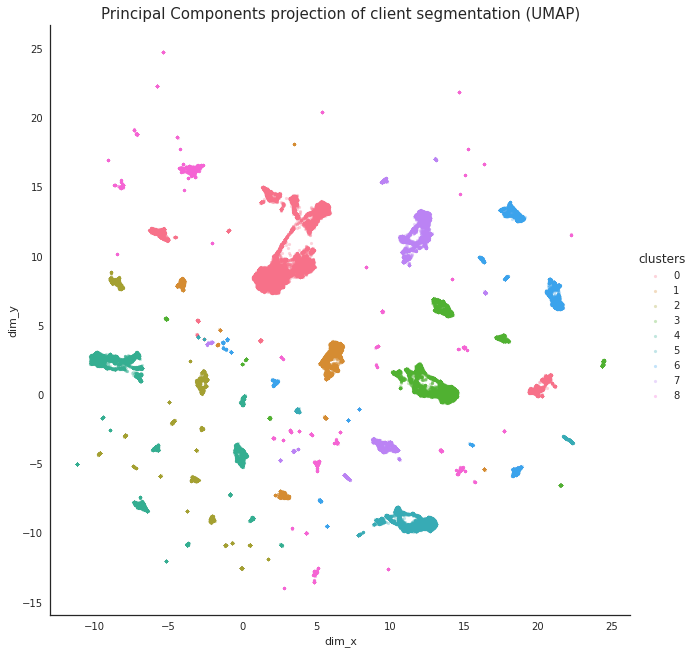

In [85]:
df_mmss_umap["clusters"] = kms[9].labels_
plot_clusters(
    x="dim_x",
    y="dim_y",
    data=df_mmss_umap,
    hue="clusters",
    title="Principal Components projection of client segmentation (UMAP)",
)

In [ ]:
%%time
clusterable_embedding = umap.UMAP(
    n_neighbors=29,
    min_dist=0.0,
    n_components=2,
    random_state=42,
)
clusterable_embedding = clusterable_embedding.fit_transform(df_mmss)
df_mmss_umap = pd.DataFrame()
df_mmss_umap['dim_x'] = clusterable_embedding[:, 0]
df_mmss_umap['dim_y'] = clusterable_embedding[:, 1]

In [ ]:
%%time
# k = 2
test = KMeans(n_clusters=2)
test = test.fit(df_mmss)
df_mmss_umap['clusters'] = test.labels_
plot_clusters(
    x='dim_x',
    y='dim_y',
    data=df_mmss_umap,
    hue='clusters',
    title="Principal Components projection of client segmentation (UMAP)",
)

In [ ]:
%%time
# k = 7
test = KMeans(n_clusters=7)
test = test.fit(df_mmss)
df_mmss_umap['clusters'] = test.labels_
plot_clusters(
    x='dim_x',
    y='dim_y',
    data=df_mmss_umap,
    hue='clusters',
    title="Principal Components projection of client segmentation (UMAP)",
)

In [ ]:
%%time
# k = 8
test = KMeans(n_clusters=8)
test = test.fit(df_mmss)
df_mmss_umap['clusters'] = test.labels_
plot_clusters(
    x='dim_x',
    y='dim_y',
    data=df_mmss_umap,
    hue='clusters',
    title="Principal Components projection of client segmentation (UMAP)",
)

In [ ]:
%%time
# k = 9
test = KMeans(n_clusters=9)
test = test.fit(df_mmss)
df_mmss_umap['clusters'] = test.labels_
plot_clusters(
    x='dim_x',
    y='dim_y',
    data=df_mmss_umap,
    hue='clusters',
    title="Principal Components projection of client segmentation (UMAP)",
)

## Anaylse des Clusters

### 7 Clusters

In [87]:
df_analyse_mmss = df_mmss.copy()
df_analyse_mmss['clusters'] =kms[7].labels_

In [88]:
clusters_mmss = {}
for cluster in range(7):
    clusters_mmss[cluster] = list(
        df_analyse_mmss[df_analyse_mmss.clusters == cluster].iloc[:, :-1].mean().values
    )
    clusters_mmss[cluster] = [*clusters_mmss[cluster], clusters_mmss[cluster][0]]

In [97]:
%%time
plot_radar(clusters_mmss[0], title='Client Segmentation - cluster 0')

CPU times: user 5.81 ms, sys: 764 µs, total: 6.58 ms
Wall time: 5.63 ms


In [91]:
%%time
plot_radar(clusters_mmss[1], title='Client Segmentation - cluster 1')

CPU times: user 6.25 ms, sys: 132 µs, total: 6.38 ms
Wall time: 5.52 ms


In [92]:
%%time
plot_radar(clusters_mmss[2], title='Client Segmentation - cluster 2')

CPU times: user 6.98 ms, sys: 0 ns, total: 6.98 ms
Wall time: 6.01 ms


In [93]:
%%time
plot_radar(clusters_mmss[3], title='Client Segmentation - cluster 3')

CPU times: user 6.26 ms, sys: 0 ns, total: 6.26 ms
Wall time: 5.46 ms


In [94]:
%%time
plot_radar(clusters_mmss[4], title='Client Segmentation - cluster 4')

CPU times: user 8.6 ms, sys: 336 µs, total: 8.93 ms
Wall time: 7.95 ms


In [95]:
%%time
plot_radar(clusters_mmss[5], title='Client Segmentation - cluster 5')

CPU times: user 6.19 ms, sys: 157 µs, total: 6.35 ms
Wall time: 6.79 ms


In [96]:
%%time
plot_radar(clusters_mmss[6], title='Client Segmentation - cluster 6')

CPU times: user 6.25 ms, sys: 82 µs, total: 6.34 ms
Wall time: 5.52 ms
